# 進化計算を行い最適な重み行列を見つける

In [1]:
import numpy as np
import pprint
import matplotlib.pyplot as plt
from scipy.optimize import differential_evolution

# from src.polynomial_sampler import  Polynomial_Sampler
load("/app/src/lib/sampler.sage")
load("/app/src/lib/buchberger.sage")
load("/app/src/lib/utils.sage")
load("/app/src/lib/differential_evolution.sage")

[[ 1  1  1]
 [ 0  0 -1]
 [ 0 -1  0]]
M(1,1,1,0,0,-1,0,-1,0)
0th additions: 549
1th additions: 650
599.5


## 環の定義

In [2]:
field =GF(32003)
# field = QQ

m_lex = matrix([[1,0,0], 
                [0,1,0], 
                [0,0,1]])

m_grlex = matrix([[1,1,1], 
                  [1,0,0], 
                  [0,1,0]])

m_grevlex = matrix([[1,1,1], 
                    [0,0,-1], 
                    [0,-1,0]])

T1 = TermOrder(m_lex)
T2 = TermOrder(m_grlex)
T3 = TermOrder(m_grevlex)


Ring_lex = PolynomialRing(field, 3, 'x', order=T1)
Ring_grlex = PolynomialRing(field, 3, 'x', order=T2)
Ring_grevlex = PolynomialRing(field, 3, 'x', order=T3)

## 多項式をサンプル

In [3]:
field = GF(32003)
# field = QQ
Ring = PolynomialRing(field, 3, 'x', order='lex')

conditions = {  'max_degree'      : 5, 
                'min_degree'      : 2,
                'max_num_terms'   : 10, 
                'max_coeff'       : 20,
                'num_bound'       : 20,
                'nonzero_instance': True,}

psampler = Polynomial_Sampler(Ring, 
                            degree_sampling='uniform', 
                            term_sampling='uniform', 
                            strictly_conditioned=True, 
                            conditions=conditions)

set_random_seed(1234) # seed値の設定
F = psampler.sample(num_samples=3)
F

[-10050*x0^2*x1 + 10402*x0*x1^2 - 10613*x0*x1*x2^3 + 1313*x0*x1 + 10893*x0 - 13750*x1^3 - 4750,
 -10499*x0*x1^3 - 2576*x1^3 + 7972*x1^2*x2^2 + 14025*x1^2 + 4775,
 10520*x1*x2^2 - 787*x1 + 6468*x2^3 - 563*x2^2 + 4480*x2 - 15127]

## 進化計算

### data内部の生成系が一つ

#### 実験

In [39]:
set_random_seed(1234) # seed値の設定

data = []
for i in range(1):
    F = psampler.sample(num_samples=3)
    data.append(F)

data

[[-10050*x0^2*x1 + 10402*x0*x1^2 - 10613*x0*x1*x2^3 + 1313*x0*x1 + 10893*x0 - 13750*x1^3 - 4750,
  -10499*x0*x1^3 - 2576*x1^3 + 7972*x1^2*x2^2 + 14025*x1^2 + 4775,
  10520*x1*x2^2 - 787*x1 + 6468*x2^3 - 563*x2^2 + 4480*x2 - 15127]]

In [41]:
bounds = [(-100000000, 100000000)] * 9

print('data: ', data)

# differential_evolution の実行
try:
    result = differential_evolution(output_additions_log, bounds, disp=False, args=(data, field, 3, 'normal', True, 100000))
    pprint.pprint(result)
except Exception as e:
    print(f"An error occurred: {e}")


data:  [[-10050*x0^2*x1 + 10402*x0*x1^2 - 10613*x0*x1*x2^3 + 1313*x0*x1 + 10893*x0 - 13750*x1^3 - 4750, -10499*x0*x1^3 - 2576*x1^3 + 7972*x1^2*x2^2 + 14025*x1^2 + 4775, 10520*x1*x2^2 - 787*x1 + 6468*x2^3 - 563*x2^2 + 4480*x2 - 15127]]
invalid matrix
[[ 66788346  61881392  62881597]
 [-63779331 -67300390  66089030]
 [ 55869824 -97230757 -74812173]]
M(66788346,61881392,62881597,-63779331,-67300390,66089030,55869824,-97230757,-74812173)
0th additions: 527
invalid matrix
invalid matrix
[[ 83940003  65802238   1288018]
 [-79593437 -10261211  34411017]
 [ 62574562 -95001637 -84245030]]
M(83940003,65802238,1288018,-79593437,-10261211,34411017,62574562,-95001637,-84245030)
0th additions: 1401
invalid matrix
invalid matrix
[[ 54200703  47600492  94276358]
 [ 84306950  99581998  23785006]
 [-26484058  80880194  -4137497]]
M(54200703,47600492,94276358,84306950,99581998,23785006,-26484058,80880194,-4137497)
0th additions: 576
invalid matrix
invalid matrix
invalid matrix
invalid matrix
invalid matr

#### 新しく得られた単項式順序と、grevlex順序との比較

In [42]:
result.x

array([ 93244713.75567144,  35861288.88665479,  21109513.11097986,
       -30425461.71357989,  68044538.9833094 ,  30177481.5923437 ,
        32050730.86562962, -20538229.18997671,  60995284.10497719])

In [43]:
params = result.x
# params = np.array([8.96836341, 2.68941825, 3.99052547, 7.73203839, 5.1118872 , 0.75170395, 7.26066613, 6.66028417, 7.29806153])

weight_matrix = matrix(3, list(params)) # paramsがnp.ndarrayの場合うまくいかない
weight_matrix_int = matrix(3, list(params.astype(int))) # paramsがnp.ndarrayの場合うまくいかない


field = GF(32003)

T = TermOrder(weight_matrix)
T_int = TermOrder(weight_matrix_int)

Ring_weight_matrix = PolynomialRing(field, 3, 'x', order=T)
Ring_weight_matrix_int = PolynomialRing(field, 3, 'x', order=T_int)

print(T._singular_str)
print(T_int._singular_str)
print(T)
print(T_int)
# T.matrix()

M(93244713,35861288,21109513,-30425461,68044538,30177481,32050730,-20538229,60995284)
M(93244713,35861288,21109513,-30425461,68044538,30177481,32050730,-20538229,60995284)
Matrix term order with matrix
[  93244713.75567144   35861288.88665479   21109513.11097986]
[-30425461.713579893    68044538.9833094  30177481.592343703]
[ 32050730.865629617 -20538229.189976707   60995284.10497719]
Matrix term order with matrix
[ 93244713  35861288  21109513]
[-30425461  68044538  30177481]
[ 32050730 -20538229  60995284]


In [44]:
GB, stats = buchberger(Ring_weight_matrix, F, select_strategy='normal')
print('groebner basis?: ', is_groebner(Ring_weight_matrix, GB))
print(stats)

groebner basis?:  True
{'zero_reductions': 7, 'nonzero_reductions': 6, 'polynomial_additions': 294, 'total_reward': -294.000000000000, 'discounted_return': -274.634391694335}


In [45]:
GB, stats = buchberger(Ring_weight_matrix_int, F, select_strategy='normal')
print('groebner basis?: ', is_groebner(Ring_weight_matrix_int, GB))
print(stats)

groebner basis?:  True
{'zero_reductions': 7, 'nonzero_reductions': 6, 'polynomial_additions': 294, 'total_reward': -294.000000000000, 'discounted_return': -274.634391694335}


grevlex順序

In [10]:
GB, stats = buchberger(Ring_grevlex, F, select_strategy='normal')
print('groebner basis?: ', is_groebner(Ring_grevlex, GB))
print(stats)            

groebner basis?:  True
{'zero_reductions': 13, 'nonzero_reductions': 14, 'polynomial_additions': 548, 'total_reward': -548.000000000000, 'discounted_return': -472.569814733511}


grlex順序

In [11]:
GB, stats = buchberger(Ring_grlex, F, select_strategy='normal')
print('groebner basis?: ', is_groebner(Ring_grlex, GB))
print(stats)

groebner basis?:  True
{'zero_reductions': 15, 'nonzero_reductions': 15, 'polynomial_additions': 642, 'total_reward': -642.000000000000, 'discounted_return': -543.553830489285}


lex順序

In [12]:
GB, stats = buchberger(Ring_lex, F, select_strategy='normal')
print('groebner basis?: ', is_groebner(Ring_lex, GB))
print(stats)

groebner basis?:  True
{'zero_reductions': 14, 'nonzero_reductions': 24, 'polynomial_additions': 1961, 'total_reward': -1961.00000000000, 'discounted_return': -1441.33208292775}


In [13]:
vars(Ring_lex.term_order())
Ring_lex.term_order()._singular_str
Ring_lex.term_order().matrix()

[1 0 0]
[0 1 0]
[0 0 1]

 #### 他の多項式集合で実験

In [2]:
field = GF(32003)
# field = QQ
Ring = PolynomialRing(field, 3, 'x', order='lex')

conditions = {  'max_degree'      : 5, 
                'min_degree'      : 2,
                'max_num_terms'   : 10, 
                'max_coeff'       : 20,
                'num_bound'       : 20,
                'nonzero_instance': True,}

psampler = Polynomial_Sampler(Ring, 
                            degree_sampling='uniform', 
                            term_sampling='uniform', 
                            strictly_conditioned=True, 
                            conditions=conditions)

set_random_seed() # seed値の設定
F2 = psampler.sample(num_samples=3)
F2

[11831*x0^3 + 13616*x0^2*x2 + 7568*x1^2*x2^2 - 11651*x1^2 - 11315*x1 + 1879,
 -10226*x0^3*x2 - 10981*x1^4 - 11856*x1^3*x2 - 11591,
 -3115*x0*x1^2 - 2868*x0*x1*x2^2 - 3622*x0*x2^2 - 9035*x0 + 14724*x1^3*x2 - 13177*x1^2*x2 - 212*x2 - 9483]

In [15]:
GB, stats = buchberger(Ring_weight_matrix, F2, select_strategy='normal')
print(is_groebner(Ring_weight_matrix, GB))
print(GB)
print(stats)

True
[x1*x2^3, x2^5 - 10839*x2^3, x0*x2^3, x0*x1^2 - 2886*x1^3*x2^2 - 2203*x1^4 - 13685*x0*x1 - 12368*x1^2*x2^2 - 4688*x1^3 - 8663*x1^2 + 8607*x1, x1^4*x2^2 - 13055*x1^5 + 9556*x0*x1*x2^2 + 14700*x1^3*x2^2 + 4235*x1^4 + 6546*x0*x1 - 14710*x1^2*x2^2 - 856*x1^3 - 14630*x1*x2^2 - 15445*x1^2 - 11020*x1, x0^2 + 11282*x0 + 7414*x2^2 - 6091*x1 - 813, x1^5*x2 - 9953*x1^4*x2 - 9029*x0*x1*x2 - 12127*x1^3*x2 - 8211*x1^2*x2 - 1041*x1*x2, x1^6 + 3503*x1^5 + 1374*x0*x1*x2^2 + 13363*x1^3*x2^2 + 7839*x1^4 - 9118*x0*x1 - 6073*x1^2*x2^2 + 6191*x1^3 - 1068*x1*x2^2 + 15207*x1^2 - 13066*x1]
{'zero_reductions': 10, 'nonzero_reductions': 9, 'polynomial_additions': 121, 'total_reward': -121.000000000000, 'discounted_return': -106.429649798928}


In [16]:
buchberger(Ring_grevlex, F2, select_strategy='normal')

([x0^2 + 7414*x2^2 + 11282*x0 - 6091*x1 - 813,
  x1*x2^3,
  x0*x2^3,
  x2^5 - 10839*x2^3,
  x1^3*x2^2 - 3581*x1^4 - 13480*x1^2*x2^2 - 7596*x0*x1^2 - 9291*x1^3 + 5516*x0*x1 + 5980*x1^2 + 3357*x1,
  x0*x1^2*x2^2 - 7162*x0*x1^3 - 11282*x1^2*x2^2 - 13935*x0*x1^2 - 5891*x1^3 + 2135*x1^2 - 10388*x1,
  x1^4*x2 - 11026*x0*x1^2*x2 + 5043*x1^3*x2 - 3335*x0*x1*x2 - 10717*x1^2*x2 - 11887*x1*x2,
  x0*x1^3*x2 + 3322*x0*x1^2*x2 - 11282*x1^3*x2 + 11640*x1^2*x2 + 8420*x1*x2,
  x1^5 - 1075*x0*x1^3 - 8437*x1^4 - 9054*x0*x1*x2^2 - 592*x1^2*x2^2 + 3336*x0*x1^2 + 15360*x1^3 + 12696*x1*x2^2 - 8415*x0*x1 + 2514*x1^2 + 1305*x1,
  x0*x1^4 + 6644*x0*x1^3 - 11282*x1^4 - 11102*x1^2*x2^2 - 5351*x0*x1^2 + 8349*x1^3 + 12629*x1*x2^2 - 15127*x1^2 + 618*x1],
 {'zero_reductions': 9,
  'nonzero_reductions': 10,
  'polynomial_additions': 77,
  'total_reward': -77.0000000000000,
  'discounted_return': -68.5449465540966})

### data内部の生成系が複数

#### 試し

In [54]:
# あるweight matrixにおいて，複数の生成系それぞれのグレブナー基底を求める．その計算に要した多項式加算数の平均を取る．

data = []
for i in range(5):
    F = psampler.sample(num_samples=3)
    data.append(F)

print('data: ', data)

params = np.array([1,1,1,0,0,-1,0,-1,0])
coeff_field = GF(32003)
num_variables = 3
additions = output_additions_log(params, data, coeff_field, num_variables=num_variables, select_strategy='degree', stop_algorithm=False, threshold=10000)
print(additions)

data:  [[-13883*x0^2*x1 + 4094*x0*x1^2 - 14937*x0*x2 - 10339*x1^2 + 7433*x1 + 6800, -8233*x1*x2 - 12758*x1 - 3699*x2^2, 3605*x0^2 - 164*x0*x1^4 + 1389*x0*x2 + 14732*x1^3 + 7502*x1 + 15785*x2^2], [-6330*x0^2*x1^2*x2 + 13365*x0^2, 7890*x0^2*x1 - 10042*x0*x1*x2 - 7321*x0*x1 + 3855*x1^2*x2 - 8059*x1^2 - 4812, -4269*x0^2*x1^2*x2 + 1744*x0 - 7882*x2], [11727*x0^3*x2^2 - 6006*x1*x2^3 + 15557*x1*x2 - 15551, 262*x0^3 + 4484*x0^2*x2^2 - 7063*x0^2 + 11503*x0 + 4861*x1^4 - 1839*x1^2 + 11954*x1*x2^2 + 8672*x2^3 + 10196*x2 - 6444, 10341*x0 + 273*x2^2], [1896*x0 + 9775*x1^2 + 3491*x1*x2 + 3963*x2 - 2490, 13876*x0^3*x2 - 3466*x0^3 - 12324*x0^2 - 11225*x0*x1*x2 - 9639*x1^2*x2^2 - 12187*x2^4 + 13019*x2 + 15738, 13999*x0*x1*x2^3 - 1382*x1^3*x2 - 15185*x1^2*x2^3 + 5943*x2^5 - 10780*x2], [-598*x0^2*x1*x2^2 - 11143*x0^2*x2^3 + 7592*x0*x1 - 23*x1^5 + 12570*x1^4 - 11146*x2, -13611*x0*x1^2 - 7163*x0*x2^3 - 8370*x0 - 15128*x1^2*x2^2 - 6415*x1 - 7080*x2^2 + 887, 10255*x0^4*x1 + 6294*x0^2*x1 + 944*x0*x1^3*x2 + 85

In [65]:
weight_matrix = matrix(3, list(params)) # paramsがnp.ndarrayの場合うまくいかない
field = GF(32003)

T = TermOrder(weight_matrix)

Ring_weight_matrix = PolynomialRing(field, 3, 'x', order=T)

GB, stats = buchberger(Ring_weight_matrix, data[2], select_strategy='normal')

print(stats['polynomial_additions'])
print(is_groebner(Ring_weight_matrix, GB))
GB 

2
True


[x2^2 + 10940*x0,
 x1^4 - 8597*x0^3 - 10476*x0^2 - 7791*x0*x1 + 12311*x1^2 - 8463*x0*x2 - 13922*x0 + 10977*x2 - 11470,
 x0^4 - 5363*x0*x1*x2 - 10821*x1*x2 + 13055]

#### 実験

In [9]:
data = []
for i in range(100):
    F = psampler.sample(num_samples=3)
    data.append(F)

data

[[2555*x0^5,
  10310*x0*x1 - 3909*x0*x2 - 12795*x0 - 12309*x1^2 + 10396*x1*x2 - 7059*x1 + 9450*x2^2 - 10092*x2 - 691,
  7710*x0*x2^3 + 11377*x1^3*x2 + 15876*x1^2*x2^2 + 14880],
 [6325*x0^3 - 2428*x0*x1*x2^2 + 9909*x0*x1 + 12718*x0 - 15829*x1^4 + 13566*x1^3 + 6610*x1^2,
  -11282*x0^3 - 8702*x1^3*x2 + 11016*x1^3 - 3433*x1*x2 + 6598,
  15504*x0^2 + 6374*x0*x1 + 749*x0 + 15232],
 [3539*x0^2*x1 + 14476*x0*x2 - 10011*x0 + 9017*x1^3 + 6459*x1^2*x2 - 14638*x1*x2^2 - 6859*x2 - 7832,
  652*x0*x1^2*x2^2 - 6081*x0*x2^2,
  10698*x0^3 - 10232*x0^2*x1*x2 - 3509*x0*x1^2 - 10126*x0*x2^2 - 14363*x0 + 4784],
 [-5061*x0^3*x1^2 + 11361*x0*x1^2 + 13917*x0*x1*x2^2 + 12426*x0*x1*x2 + 4995*x0*x1 - 10394*x2^2 - 8900*x2 + 2985,
  11283*x0*x1 - 2275*x0*x2 - 11023*x0 + 7481*x1^2 - 11629*x1 + 13967*x2^2 - 6559,
  11132*x0^4 - 12096*x0^3*x1 + 5045*x0^2*x1 + 4107*x0*x2 + 8397*x1^3 + 14313*x1^2 + 8410*x1*x2 + 14728*x2^3 - 7318*x2 + 885],
 [-13975*x0^2*x2 - 8037*x0*x1^2 + 14493*x0*x1*x2 - 5030*x0*x1 + 10697*x1*x2 - 122

In [10]:
bounds = [(-100000000, 100000000)] * 9

print('data: ', data)

# differential_evolution の実行
try:
    result = differential_evolution(output_additions_log, bounds, disp=False, args=(data, field, 3, 'normal', True, 100000))
    pprint.pprint(result)
except Exception as e:
    print(f"An error occurred: {e}")

data:  [[2555*x0^5, 10310*x0*x1 - 3909*x0*x2 - 12795*x0 - 12309*x1^2 + 10396*x1*x2 - 7059*x1 + 9450*x2^2 - 10092*x2 - 691, 7710*x0*x2^3 + 11377*x1^3*x2 + 15876*x1^2*x2^2 + 14880], [6325*x0^3 - 2428*x0*x1*x2^2 + 9909*x0*x1 + 12718*x0 - 15829*x1^4 + 13566*x1^3 + 6610*x1^2, -11282*x0^3 - 8702*x1^3*x2 + 11016*x1^3 - 3433*x1*x2 + 6598, 15504*x0^2 + 6374*x0*x1 + 749*x0 + 15232], [3539*x0^2*x1 + 14476*x0*x2 - 10011*x0 + 9017*x1^3 + 6459*x1^2*x2 - 14638*x1*x2^2 - 6859*x2 - 7832, 652*x0*x1^2*x2^2 - 6081*x0*x2^2, 10698*x0^3 - 10232*x0^2*x1*x2 - 3509*x0*x1^2 - 10126*x0*x2^2 - 14363*x0 + 4784], [-5061*x0^3*x1^2 + 11361*x0*x1^2 + 13917*x0*x1*x2^2 + 12426*x0*x1*x2 + 4995*x0*x1 - 10394*x2^2 - 8900*x2 + 2985, 11283*x0*x1 - 2275*x0*x2 - 11023*x0 + 7481*x1^2 - 11629*x1 + 13967*x2^2 - 6559, 11132*x0^4 - 12096*x0^3*x1 + 5045*x0^2*x1 + 4107*x0*x2 + 8397*x1^3 + 14313*x1^2 + 8410*x1*x2 + 14728*x2^3 - 7318*x2 + 885], [-13975*x0^2*x2 - 8037*x0*x1^2 + 14493*x0*x1*x2 - 5030*x0*x1 + 10697*x1*x2 - 12229*x2^2 - 150

In [11]:
sum_additions = 0

for polynomial_list in data:
    GB, stats = buchberger(Ring_grevlex, polynomial_list, select_strategy='normal')
   
    # print(stats['polynomial_additions'])
    sum_additions += stats['polynomial_additions']

sum_additions / len(data)

8187/25

#### 分析

In [12]:
params = result.x
# params = np.array([1,1,1,0,0,-1,0,-1,0])
weight_matrix = matrix(3, list(params)) # paramsがnp.ndarrayの場合うまくいかない
T = TermOrder(weight_matrix)
Ring_weight_matrix = PolynomialRing(GF(32003), 3, 'x', order=T)

# Ring_list = [Ring_weight_matrix, Ring_grevlex, Ring_grlex, Ring_lex]
Ring_list = [Ring_weight_matrix, Ring_grevlex, Ring_grlex]


In [13]:
all_additions = np.zeros((0, len(Ring_list)))
threshold = 10000

for polynomial_list in data:
    each_additions = np.array([])
    for Ring in Ring_list:
        GB, stats = buchberger(Ring, polynomial_list, select_strategy='normal', stop_algorithm=True, threshold=threshold)

        if not GB: # buchberger algorithmが途中で打ち切られた場合
            each_additions = np.append(each_additions, threshold)
            continue

        if is_groebner(Ring, GB): # buchberger algorithmが正常に終了した場合
            each_additions = np.append(each_additions, stats['polynomial_additions'])
        else:
            each_additions = np.append(each_additions, np.nan)

    all_additions = np.vstack([all_additions, each_additions])
           
all_additions

array([[  36.,  738.,  869.],
       [ 401.,  280.,  338.],
       [ 379.,  410.,  399.],
       [ 214.,  653.,  838.],
       [ 628.,  596.,  667.],
       [1265., 1436., 1236.],
       [ 178.,  303.,  278.],
       [ 205.,  154.,  177.],
       [ 854.,  926., 1081.],
       [ 181.,  212.,  165.],
       [ 137.,   98.,   98.],
       [ 304.,  271.,  368.],
       [   9.,  161.,  189.],
       [ 805.,  882.,  768.],
       [ 154.,  145.,  188.],
       [ 183.,  199.,  200.],
       [ 997.,  979.,  992.],
       [  58.,   57.,   70.],
       [ 206.,  195.,  245.],
       [  62.,   63.,   66.],
       [ 671.,  571.,  744.],
       [ 648.,  206.,  206.],
       [  61.,    2.,    2.],
       [ 747., 1233., 1245.],
       [ 244.,    9.,    9.],
       [  86.,   47.,   77.],
       [ 139.,  366.,  327.],
       [ 373.,  516.,  548.],
       [ 224.,  400.,  453.],
       [  77.,  145.,  145.],
       [  25.,   47.,   47.],
       [ 267.,  228.,  225.],
       [ 270.,  220.,  270.],
       [ 4

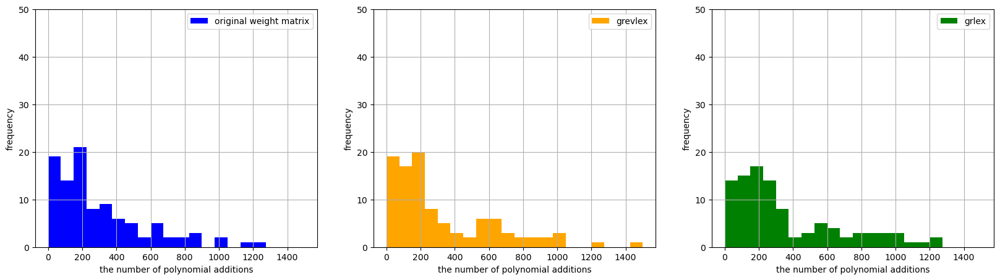

In [19]:
fig = plt.figure(figsize=(20, 5))

ax1 = fig.add_subplot(1, 3, 1)
ax2 = fig.add_subplot(1, 3, 2)
ax3 = fig.add_subplot(1, 3, 3)
# ax4 = fig.add_subplot(2, 2, 4)

# Ensure all_additions is a NumPy array with the correct data type
all_additions = np.array(all_additions, dtype=float)

x = (float(0), float(1500))
bins = 20
ax1.hist(all_additions[:, 0], range= x, bins=bins, label='original weight matrix', color='blue')
ax2.hist(all_additions[:, 1], range= x, bins=bins, label='grevlex', color='orange')
ax3.hist(all_additions[:, 2], range= x, bins=bins, label='grlex', color='green')
# ax4.hist(all_additions[:, 3], range=(float(0), float(10000)), bins=bins, label='lex', color='red')

upper = 50
ax1.set_ylim(0, upper)
ax2.set_ylim(0, upper)
ax3.set_ylim(0, upper)
# ax4.set_ylim(0, 100)

ax1.set_xlabel('the number of polynomial additions')
ax2.set_xlabel('the number of polynomial additions')
ax3.set_xlabel('the number of polynomial additions')
# ax4.set_xlabel('the number of polynomial additions')

ax1.set_ylabel('frequency')
ax2.set_ylabel('frequency')
ax3.set_ylabel('frequency')
# ax4.set_ylabel('frequency')

ax1.grid(True)
ax2.grid(True)
ax3.grid(True)
# ax4.grid(True)

ax1.legend()
ax2.legend()
ax3.legend()

fig.show()


## QQで実験

In [17]:
# field = QQ
# Ring = PolynomialRing(field, 3, 'x', order='lex')

# conditions = {  'max_degree'      : 5, 
#                 'min_degree'      : 2,
#                 'max_num_terms'   : 10, 
#                 'max_coeff'       : 20,
#                 'num_bound'       : 20,
#                 'nonzero_instance': True,}

# psampler = Polynomial_Sampler(Ring, 
#                             degree_sampling='uniform', 
#                             term_sampling='uniform', 
#                             strictly_conditioned=True, 
#                             conditions=conditions)

# set_random_seed(1234) # seed値の設定
# F = psampler.sample(num_samples=3)
# F